In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('/kaggle/input/personal-key-indicators-of-heart-disease/2022/heart_2022_with_nans.csv')

In [4]:
df.shape

(445132, 40)

In [3]:
df.head()

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,SleepHours,RemovedTeeth,HadHeartAttack,...,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,TetanusLast10Tdap,HighRiskLastYear,CovidPos
0,Alabama,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,8.0,NaN,No,...,NaN,NaN,NaN,No,No,Yes,No,"Yes, received tetanus shot but not sure what type",No,No
1,Alabama,Female,Excellent,0.0,0.0,NaN,No,6.0,NaN,No,...,1.60,68.04,26.57,No,No,No,No,"No, did not receive any tetanus shot in the pa...",No,No
2,Alabama,Female,Very good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,5.0,NaN,No,...,1.57,63.50,25.61,No,No,No,No,NaN,No,Yes
3,Alabama,Female,Excellent,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,7.0,NaN,No,...,1.65,63.50,23.30,No,No,Yes,Yes,"No, did not receive any tetanus shot in the pa...",No,No
4,Alabama,Female,Fair,2.0,0.0,Within past year (anytime less than 12 months ...,Yes,9.0,NaN,No,...,1.57,53.98,21.77,Yes,No,No,Yes,"No, did not receive any tetanus shot in the pa...",No,No


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 445132 entries, 0 to 445131
Data columns (total 40 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      445132 non-null  object 
 1   Sex                        445132 non-null  object 
 2   GeneralHealth              443934 non-null  object 
 3   PhysicalHealthDays         434205 non-null  float64
 4   MentalHealthDays           436065 non-null  float64
 5   LastCheckupTime            436824 non-null  object 
 6   PhysicalActivities         444039 non-null  object 
 7   SleepHours                 439679 non-null  float64
 8   RemovedTeeth               433772 non-null  object 
 9   HadHeartAttack             442067 non-null  object 
 10  HadAngina                  440727 non-null  object 
 11  HadStroke                  443575 non-null  object 
 12  HadAsthma                  443359 non-null  object 
 13  HadSkinCancer              44

In [6]:
df.describe()

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,WeightInKilograms,BMI
count,434205.000000,436065.000000,439679.000000,416480.000000,403054.000000,396326.000000
mean,4.347919,4.382649,7.022983,1.702691,83.074470,28.529842
std,8.688912,8.387475,1.502425,0.107177,21.448173,6.554889
min,0.000000,0.000000,1.000000,0.910000,22.680000,12.020000
25%,0.000000,0.000000,6.000000,1.630000,68.040000,24.130000
50%,0.000000,0.000000,7.000000,1.700000,80.740000,27.440000
75%,3.000000,5.000000,8.000000,1.780000,95.250000,31.750000
max,30.000000,30.000000,24.000000,2.410000,292.570000,99.640000


In [8]:
df.isnull().sum()

State                            0
Sex                              0
GeneralHealth                 1198
PhysicalHealthDays           10927
MentalHealthDays              9067
LastCheckupTime               8308
PhysicalActivities            1093
SleepHours                    5453
RemovedTeeth                 11360
HadHeartAttack                3065
HadAngina                     4405
HadStroke                     1557
HadAsthma                     1773
HadSkinCancer                 3143
HadCOPD                       2219
HadDepressiveDisorder         2812
HadKidneyDisease              1926
HadArthritis                  2633
HadDiabetes                   1087
DeafOrHardOfHearing          20647
BlindOrVisionDifficulty      21564
DifficultyConcentrating      24240
DifficultyWalking            24012
DifficultyDressingBathing    23915
DifficultyErrands            25656
SmokerStatus                 35462
ECigaretteUsage              35660
ChestScan                    56046
RaceEthnicityCategor

In [9]:
(df.isnull().sum() / len(df)) * 100

State                         0.000000
Sex                           0.000000
GeneralHealth                 0.269134
PhysicalHealthDays            2.454777
MentalHealthDays              2.036924
LastCheckupTime               1.866413
PhysicalActivities            0.245545
SleepHours                    1.225030
RemovedTeeth                  2.552052
HadHeartAttack                0.688560
HadAngina                     0.989594
HadStroke                     0.349784
HadAsthma                     0.398309
HadSkinCancer                 0.706083
HadCOPD                       0.498504
HadDepressiveDisorder         0.631723
HadKidneyDisease              0.432681
HadArthritis                  0.591510
HadDiabetes                   0.244197
DeafOrHardOfHearing           4.638399
BlindOrVisionDifficulty       4.844406
DifficultyConcentrating       5.445576
DifficultyWalking             5.394355
DifficultyDressingBathing     5.372564
DifficultyErrands             5.763684
SmokerStatus             

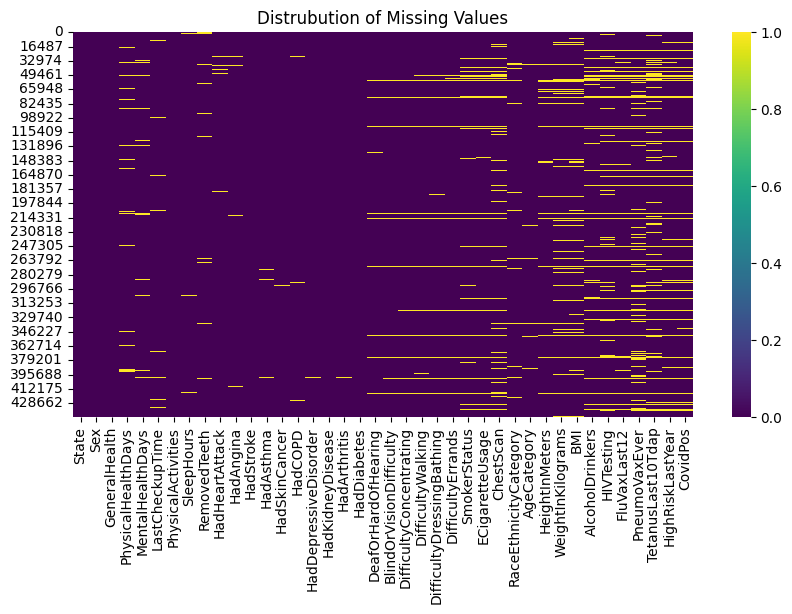

In [12]:
plt.figure(figsize=(10, 5))
sns.heatmap(df.isnull(),cmap="viridis")
plt.title("Distrubution of Missing Values")
plt.show()

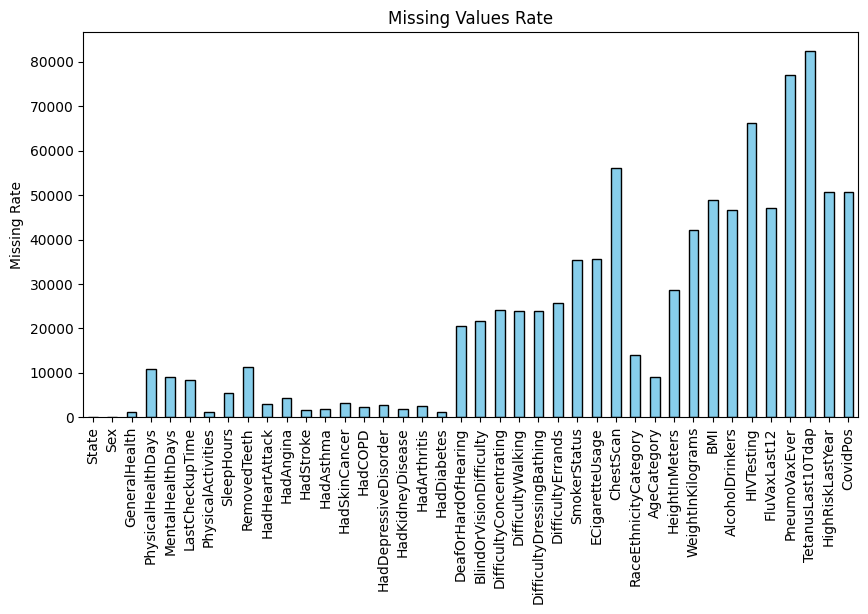

In [14]:
df.isnull().sum().plot(kind="bar", figsize=(10, 5), color="skyblue", edgecolor="black")
plt.title("Missing Values Rate")
plt.ylabel("Missing Rate")
plt.show()

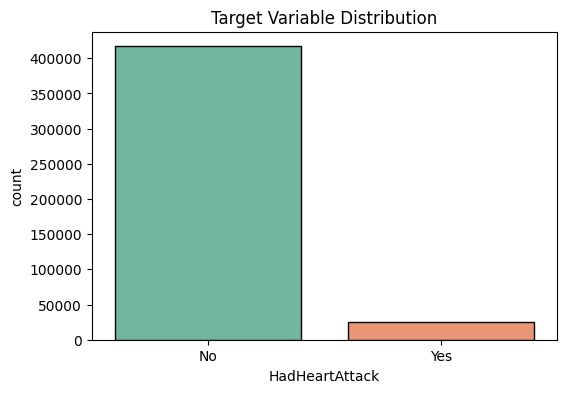

In [16]:
plt.figure(figsize=(6, 4))
sns.countplot(x='HadHeartAttack', data=df, palette='Set2' , edgecolor='black')
plt.title("Target Variable Distribution")
plt.show()

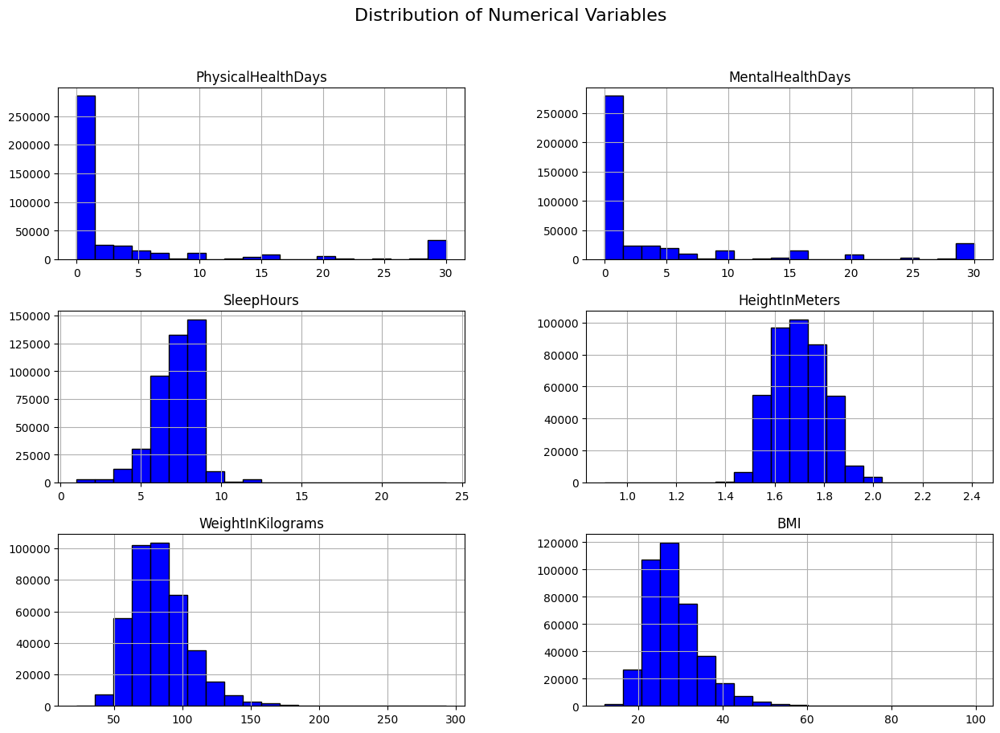

In [20]:
df.hist(figsize=(15, 10), bins=20, color='blue', edgecolor='black')
plt.suptitle("Distribution of Numerical Variables", fontsize=16)
plt.show()

In [21]:
categorical_columns = df.select_dtypes(include=['object']).columns

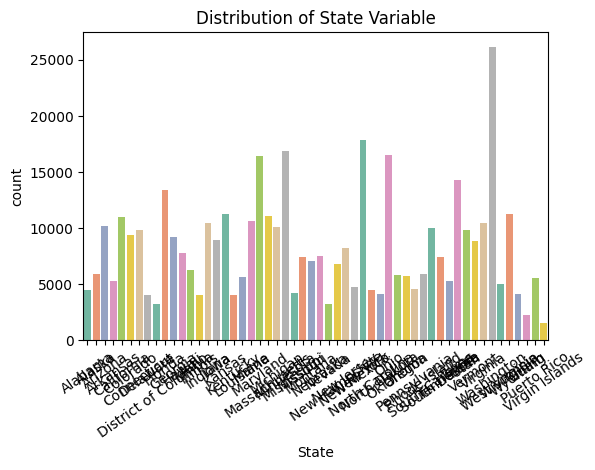

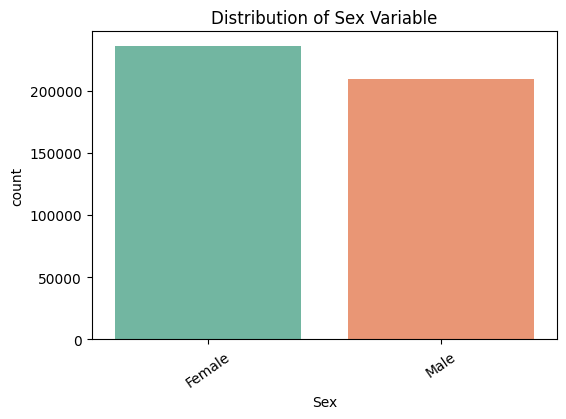

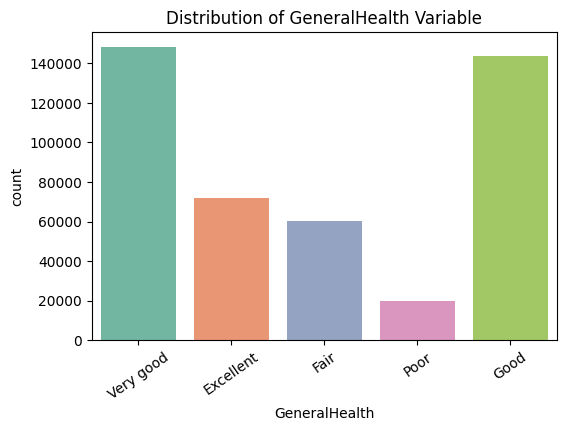

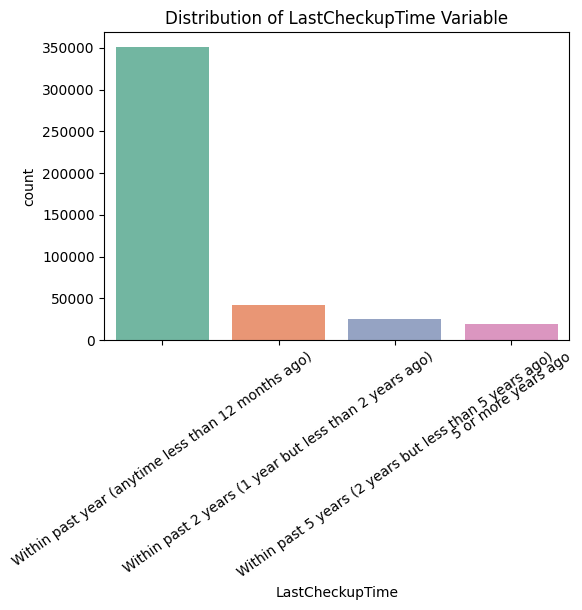

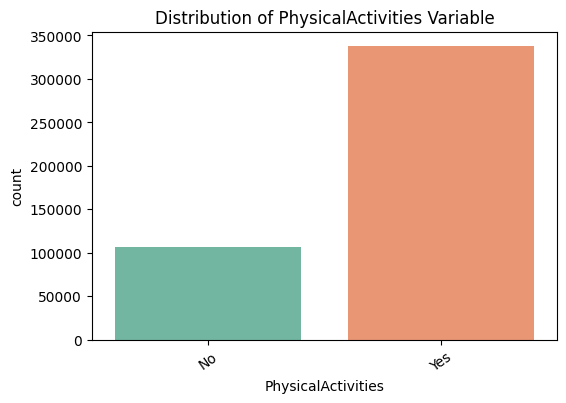

...

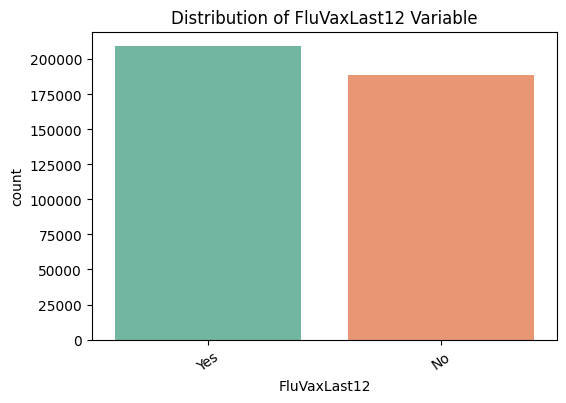

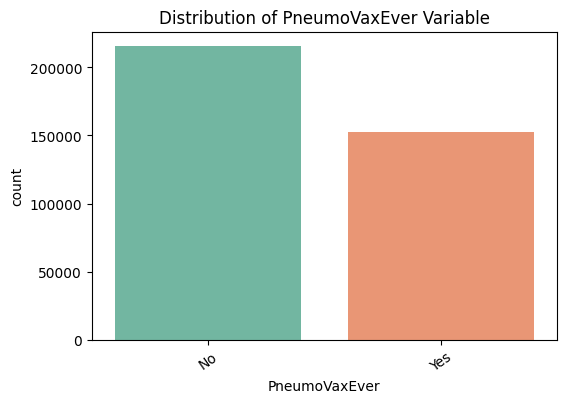

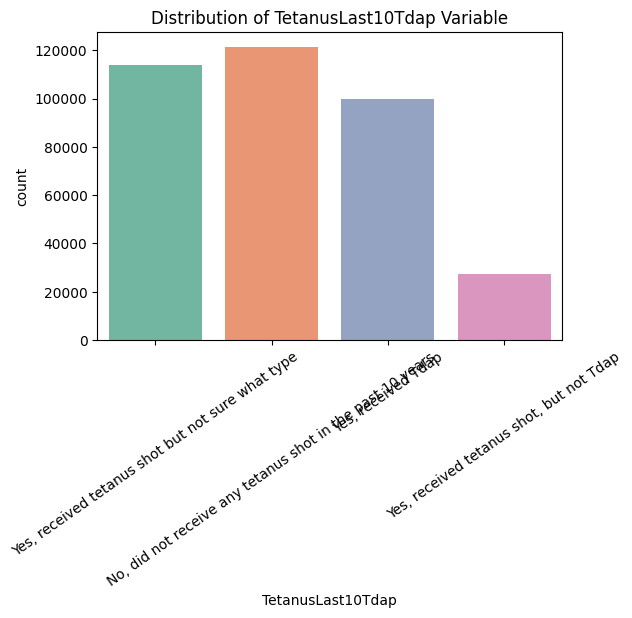

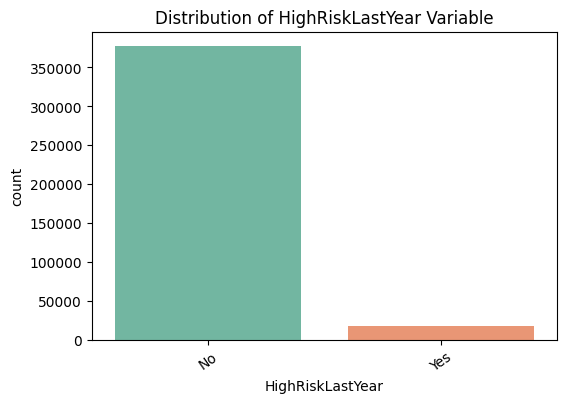

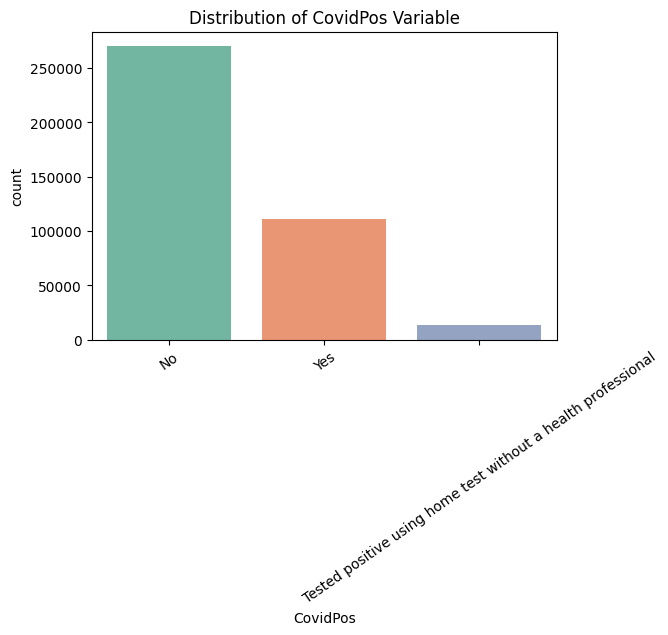

In [31]:
for column in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=column, data=df, palette='Set2')
    plt.title(f"Distribution of {column} Variable")
    plt.xticks(rotation=35)
    plt.show()

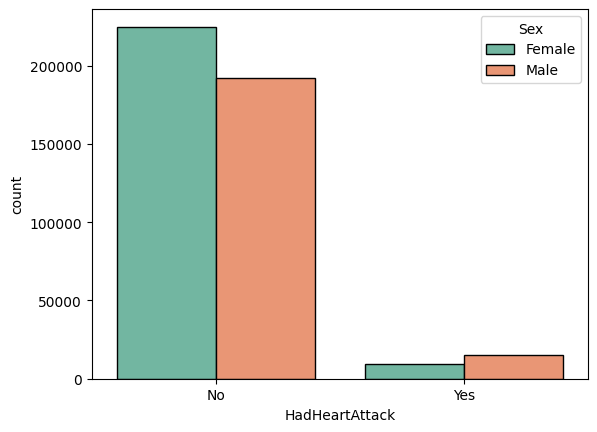

In [32]:
sns.countplot(data = df ,x = 'HadHeartAttack' , hue = 'Sex' , palette='Set2',  edgecolor='black') 
plt.show()

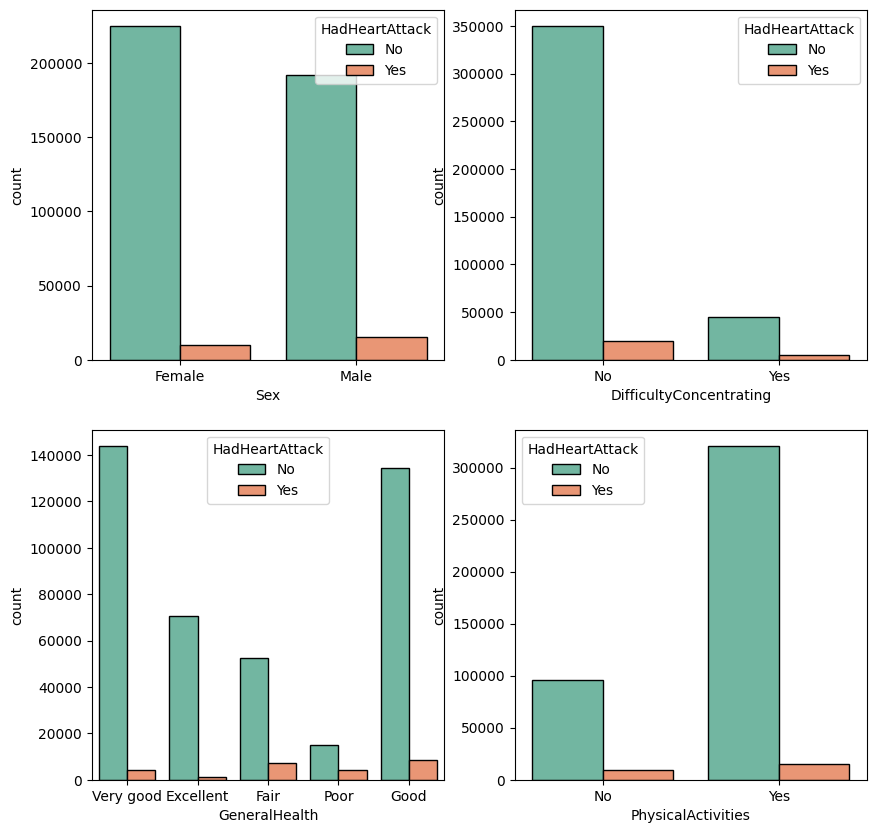

In [38]:
plt.figure(figsize=(10, 10))

plt.subplot(2 , 2 , 1)
sns.countplot(data = df ,hue = 'HadHeartAttack' , x = 'Sex' , palette='Set2' , edgecolor='black') 

plt.subplot(2 , 2 , 2)
sns.countplot(data = df ,hue = 'HadHeartAttack' , x = 'DifficultyConcentrating' , palette='Set2' , edgecolor='black') 

plt.subplot(2 , 2 , 3)
sns.countplot(data = df ,hue = 'HadHeartAttack' , x = 'GeneralHealth' , palette='Set2' , edgecolor='black') 

plt.subplot(2 , 2 , 4)
sns.countplot(data = df ,hue = 'HadHeartAttack' , x = 'PhysicalActivities' , palette='Set2',  edgecolor='black') 

plt.show()

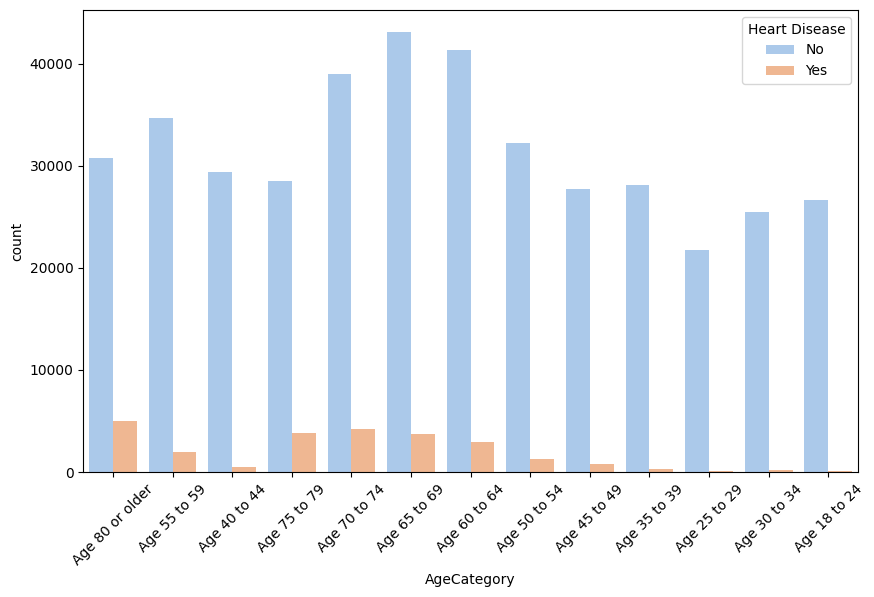

In [52]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='AgeCategory', hue='HadHeartAttack', palette='pastel')
plt.legend(title='Heart Disease')
plt.xticks(rotation=45)
plt.show()

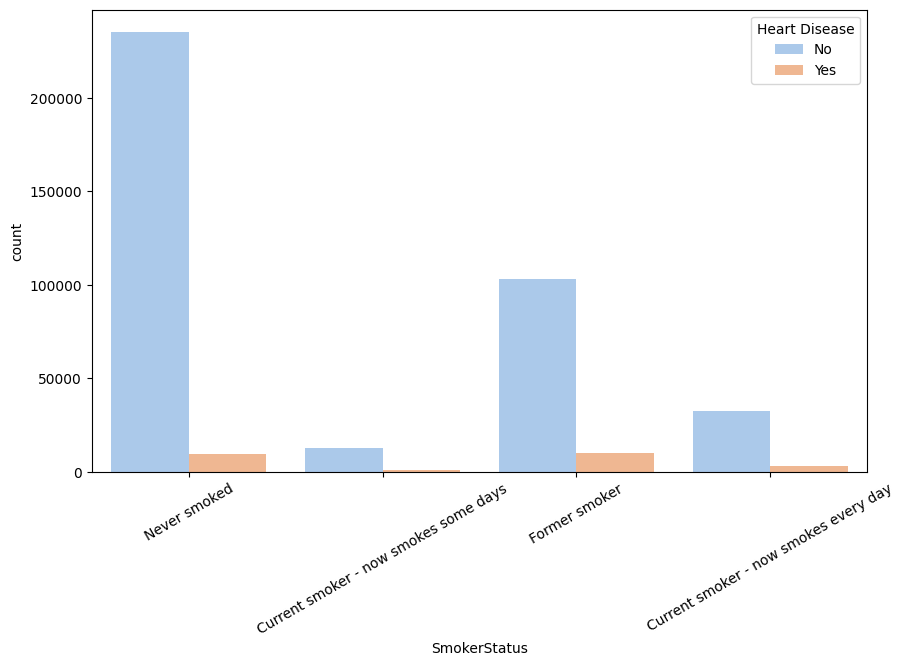

In [54]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='SmokerStatus', hue='HadHeartAttack', palette='pastel')
plt.legend(title='Heart Disease')
plt.xticks(rotation=30)
plt.show()

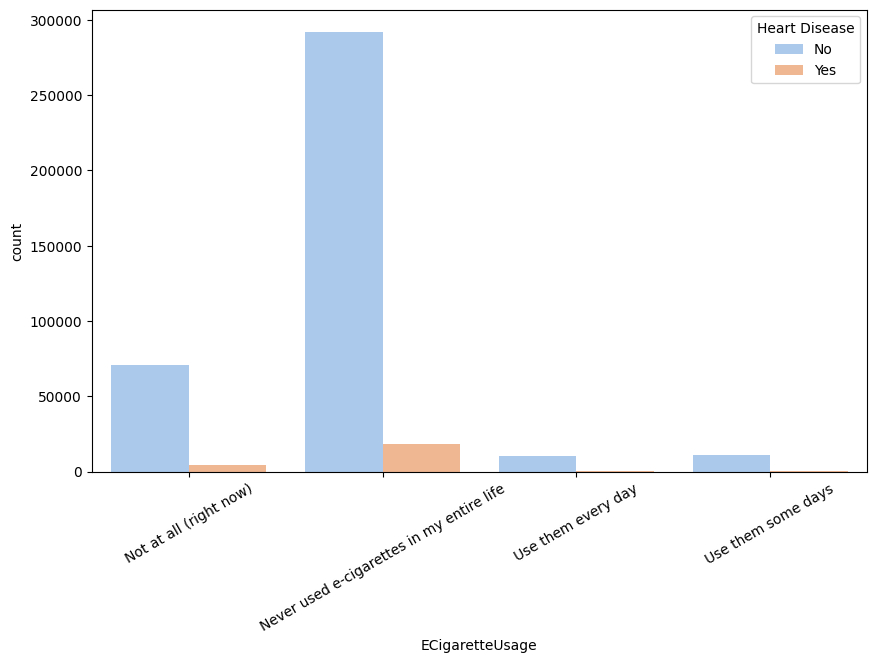

In [56]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='ECigaretteUsage', hue='HadHeartAttack', palette='pastel')
plt.legend(title='Heart Disease')
plt.xticks(rotation=30)
plt.show()

In [59]:
GeneralHealth_counts = df['GeneralHealth'].value_counts()
fig = px.bar(data_frame=df , x = GeneralHealth_counts.index , y = GeneralHealth_counts.values , title='Distribution of General Health')
fig.show()

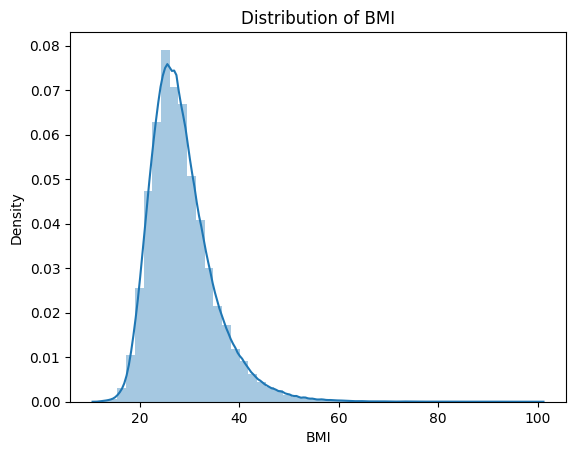

In [65]:
sns.distplot(df["BMI"])
plt.title('Distribution of BMI')
plt.show()

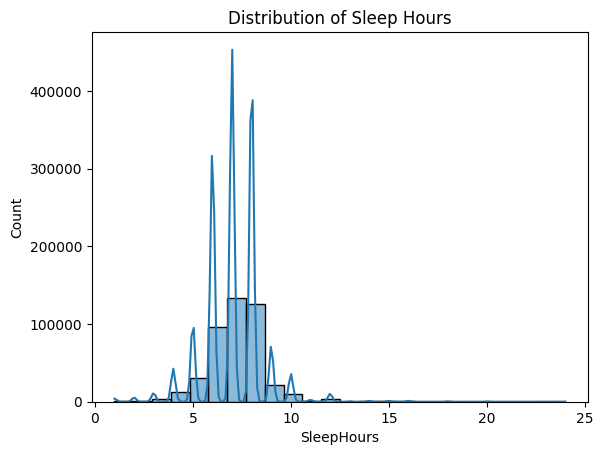

In [66]:
sns.histplot(df['SleepHours'], kde=True, bins=24)
plt.title('Distribution of Sleep Hours')
plt.show()

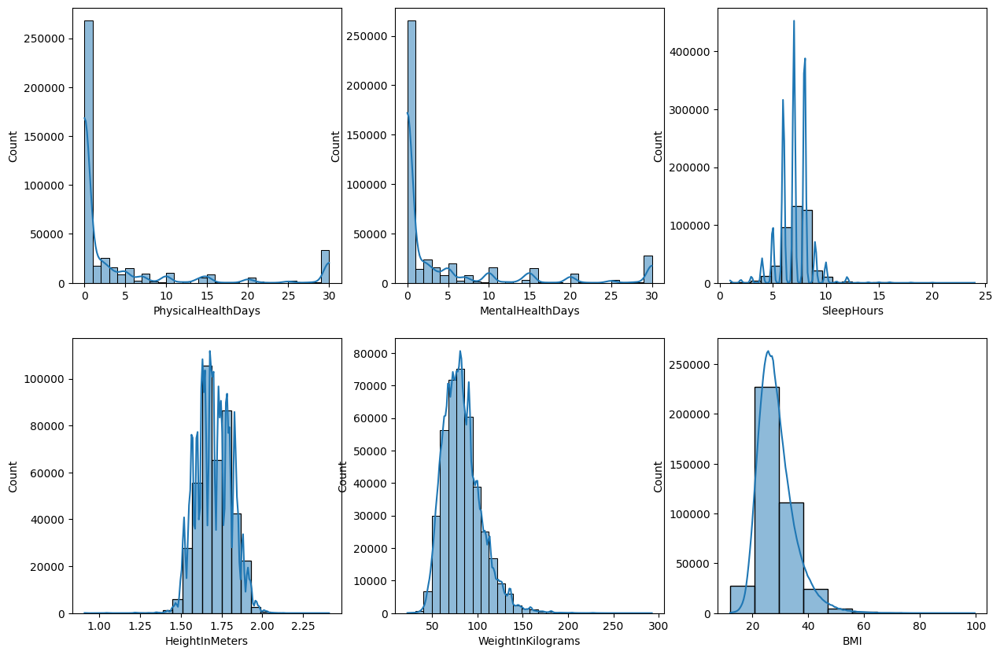

In [72]:
plt.figure(figsize=(15, 10))


plt.subplot(2 , 3 , 1)
sns.histplot(df['PhysicalHealthDays'], kde=True, bins=30)

plt.subplot(2 , 3 , 2)
sns.histplot(df['MentalHealthDays'], kde=True, bins=30)

plt.subplot(2 , 3 , 3)
sns.histplot(df['SleepHours'], kde=True, bins=24)

plt.subplot(2 , 3 , 4)
sns.histplot(df['HeightInMeters'], kde=True, bins=25)

plt.subplot(2 , 3 , 5)
sns.histplot(df['WeightInKilograms'], kde=True, bins=30)

plt.subplot(2 , 3 , 6)
sns.histplot(df['BMI'], kde=True, bins=10)

plt.show()

In [73]:
df.dtypes

State                         object
Sex                           object
GeneralHealth                 object
PhysicalHealthDays           float64
MentalHealthDays             float64
LastCheckupTime               object
PhysicalActivities            object
SleepHours                   float64
RemovedTeeth                  object
HadHeartAttack                object
HadAngina                     object
HadStroke                     object
HadAsthma                     object
HadSkinCancer                 object
HadCOPD                       object
HadDepressiveDisorder         object
HadKidneyDisease              object
HadArthritis                  object
HadDiabetes                   object
DeafOrHardOfHearing           object
BlindOrVisionDifficulty       object
DifficultyConcentrating       object
DifficultyWalking             object
DifficultyDressingBathing     object
DifficultyErrands             object
SmokerStatus                  object
ECigaretteUsage               object
C

In [74]:
number_columns = df.select_dtypes(include=['float64']).columns

In [76]:
number_columns

Index(['PhysicalHealthDays', 'MentalHealthDays', 'SleepHours',
       'HeightInMeters', 'WeightInKilograms', 'BMI'],
      dtype='object')

In [ ]:
for number in number_columns:
    fig = px.box(data_frame=df, y=number, title=f'Box plot of {number}')
    fig.show()

In [78]:
df.corr(numeric_only = True)

,PhysicalHealthDays,MentalHealthDays,SleepHours,HeightInMeters,WeightInKilograms,BMI
PhysicalHealthDays,1.000000,0.321349,-0.055906,-0.050867,0.072838,0.112865
MentalHealthDays,0.321349,1.000000,-0.129075,-0.049473,0.040345,0.075891
SleepHours,-0.055906,-0.129075,1.000000,-0.014668,-0.053521,-0.050805
HeightInMeters,-0.050867,-0.049473,-0.014668,1.000000,0.467892,-0.028349
WeightInKilograms,0.072838,0.040345,-0.053521,0.467892,1.000000,0.859557
BMI,0.112865,0.075891,-0.050805,-0.028349,0.859557,1.000000


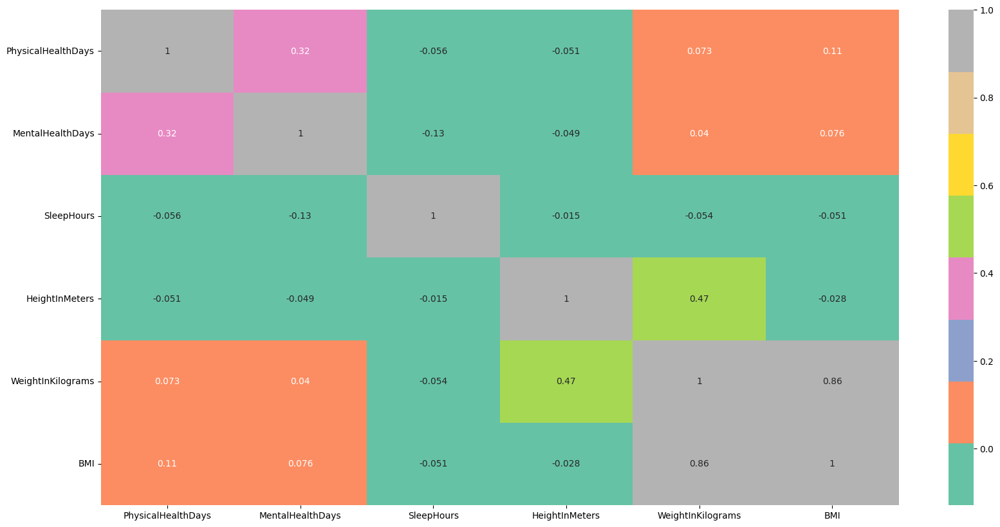

In [79]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(numeric_only = True), annot=True ,cmap='Set2')
plt.show()